In [1]:
import json
import numpy as np
import jax.numpy as jnp

from compile_from_dict import numpy_compile, jax_compile
import pandas as pd
import corner
import matplotlib.pyplot as plt

import numpyro, os, json
import numpyro.distributions as dist
import jax.numpy as jnp
from numpyro.infer import Predictive
import arviz as az
import jax

from numpyro import handlers
from numpyro.infer import MCMC, NUTS, Predictive

In [2]:
def unnorm_matrix(values, normalisation_constants):

    mins = normalisation_constants[0]

    maxes = normalisation_constants[1]

    return values*(maxes - mins) + mins

def norm_matrix(values, normalisation_constants):

    mins = normalisation_constants[0]

    maxes = normalisation_constants[1]

    return (values - mins)/(maxes - mins)


In [3]:
model_name = 'M4-test'
with open(f'models/{model_name}.json', 'r') as fp:
    model_dict = json.load(fp)

In [4]:
jax_model = jax_compile(model_dict)

In [5]:
seed = 42

df_full = pd.read_hdf('../M4/grids/Chiara-dnufit.hdf5', key='df') ## edit for your grid!!

df_full['logLPhot'] = np.log10(df_full['LPhot'])

df_full['lognumax'] = np.log10(df_full['numax']*3090)

df_full['logdnufit'] = np.log10(df_full['dnufit'])

df_full['logAge'] = np.log10(df_full['age'])

#### define inputs
inputs = ['massini', 'zini', 'yini', 'alphaMLT', 'logAge', 'eta', 'alphaFe']

#### define outputs
classical_outputs = ['FeH', 'logLPhot', 'Teff']
astero_outputs = ['lognumax', 'logdnufit'] 

outputs = classical_outputs+astero_outputs

df = df_full[inputs+outputs]

df_norm = (df - df.min())/(df.max() - df.min())
df_train = df.sample(frac=0.95, random_state=seed)
df_test_norm = df_norm.drop(df_train.index)
df_test = df.drop(df_train.index)
df_small = df_full.sample(1000)

preds_norm = np.array(jax_model.jit_forward_pass(np.array(df_test[inputs])))

In [6]:
df_full['dnufit']

0          39.210915
1          39.203877
2          39.199900
3          39.191193
4          39.171769
             ...    
7483741     1.953758
7483742     1.950303
7483743     1.946820
7483744     1.943371
7483745     1.939931
Name: dnufit, Length: 7483746, dtype: float64

In [55]:
preds_df_norm = pd.DataFrame(np.array(jax_model.jit_forward_pass(np.array(df_test_norm[inputs]))), columns = outputs)
preds_df = preds_df_norm*(df[outputs].max() -df[outputs].min()) + df[outputs].min()

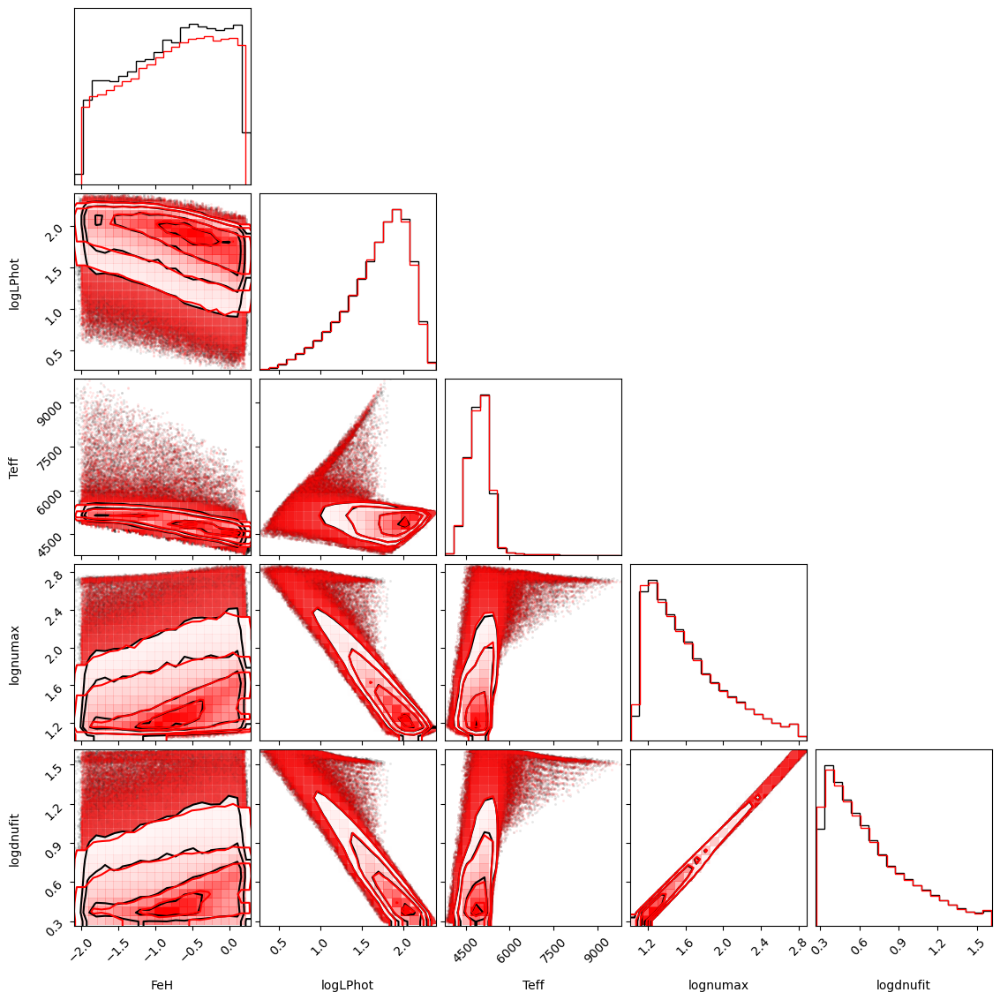

In [56]:
fig = corner.corner(preds_df)
corner.corner(np.array(df_test[outputs]), fig = fig, color = 'red', alpha = 0.3)
plt.show()

In [22]:
T22 = pd.read_csv('../M4/data/T22M08.csv')
pbjam = pd.read_csv('../M4/data/pbjam-results-dnu.csv')

data = T22.merge(pbjam, on = 'WID')
data = data[~data['WID'].isin(['W760', 'W1763', 'W1912', 'W2034'])].reset_index().drop('index', axis = 1)

IDs = data['WID']

dnu = data['dnu_pbjam']
ednu_obs = data['ednu_pbjam']
ednu_pred = 0.007*dnu
ednu = np.sqrt(ednu_obs**2 + ednu_pred**2)

LPhot = data['LPhot']
eLPhot_obs = data['eLPhot']
eLPhot_pred = 0.011*LPhot
eLPhot = np.sqrt(eLPhot_obs**2 + eLPhot_pred**2)

Teff = data['Teff']
maxes_in = df[inputs].max().values
mins_in = df[inputs].min().values
maxes_out = df[outputs].max().values
mins_out = df[outputs].min().values

In [23]:
data

,WID,Teff,Teff_M08,numax,enumax,dnu,ednu,LPhot,eLPhot,[Fe/HI],alphaFe,dnu_pbjam,ednu_pbjam
0,W1091,4787.0,4800.0,31.402,1.722,3.899,0.296,48.529,5.227,-1.070,0.41750,4.027438,0.014276
1,W2021,4841.0,4880.0,44.785,1.422,5.374,0.229,32.030,3.448,-0.990,0.35500,5.131206,0.020731
2,W2162,4782.0,4790.0,35.280,1.784,4.245,0.359,41.995,4.528,-1.110,0.38500,4.233716,0.028549
3,W2678,4805.0,4800.0,31.495,0.878,3.862,0.300,45.290,4.884,-1.030,0.41500,4.005237,0.011162
4,W3480,4875.0,4830.0,45.087,1.775,5.228,0.182,34.725,3.550,-1.080,0.38250,4.967934,0.018545
5,W3564,4803.0,4850.0,31.958,2.938,4.029,0.230,47.534,5.117,-1.000,0.36250,3.912133,0.012328
6,W491,4788.0,4788.0,38.724,0.965,4.616,0.180,37.865,4.083,-1.047,0.38375,4.632540,0.020845
7,W508,4926.0,4926.0,75.929,2.367,7.613,0.231,21.765,2.192,-1.047,0.38375,7.759877,0.008695
8,W779,4844.0,4844.0,53.392,2.258,6.056,0.171,28.142,3.030,-1.047,0.38375,6.490228,0.029432
9,W837,5030.0,5030.0,123.780,3.537,11.765,0.309,12.892,1.235,-1.047,0.38375,11.921672,0.025141


In [24]:
obs_values = np.full((len(outputs) + 3), None)
        
obs_dict = {}
        
for key, value in zip(outputs + ['LPhot', 'numax', 'dnuSer'], obs_values):
    if key not in obs_dict:
        obs_dict[key] = value
    else:
        obs_dict[key].append(value)
obs_dict

{'FeH': None,
 'logLPhot': None,
 'Teff': None,
 'lognumax': None,
 'logdnufit': None,
 'LPhot': None,
 'numax': None,
 'dnuSer': None}

In [25]:
def massfromage(age):
    logage = np.log(age)
    return np.exp(-0.3*logage + 2.4)

def lnsigmoid(x, k, mini, spread):
    s = k*(x - mini)/spread
    y = (1 + jnp.exp(-s))
    return -1*jnp.log(y)

def sample_beta(param_name, loc, scale, alpha = 2, beta = 2):

    beta_samp = numpyro.sample(f'{param_name}_beta', dist.Beta(alpha, beta))

    return numpyro.deterministic(param_name, loc + scale*beta_samp)

In [26]:
def star(uncs, obs = obs_dict):

    with numpyro.plate("star", num_stars):    

        age = numpyro.sample('age', dist.TruncatedNormal(11000, 3000, low = 100, high = 16000))

        tau = sample_beta('tau', 1.0, 0.5, alpha = 2, beta = 2)

        massini = numpyro.deterministic ('massini', tau*jnp.exp(-0.3*jnp.log(age) + 2.4))

        numpyro.factor('logfac',lnsigmoid(massini, 10, 0.7, 0.01))

        zini = sample_beta('zini', 0.5*0.01756*10**-1.1, 2*0.01756*10**-1.1, alpha = 2, beta = 2) #This is probably far too conservative 

        yini = sample_beta('yini', 0.23, 0.05, alpha = 2.5, beta = 5)

        alphaMLT = sample_beta('alphaMLT', 1.5, 0.8, alpha = 1.5, beta = 1.5)

        eta = sample_beta('eta', 0.0004, 0.29, alpha = 1.5, beta = 1.5)

        alphaFe = sample_beta('alphaFe', 0.31, 0.15, alpha = 5, beta = 5)
#        alphaFe = numpyro.sample('alphaFe', dist.Normal(uncs['alphaFe'], 0.05))
        #I have put this here as a custom prior on each star - really it should be in the data, but that requires retraining the network I think
               
        params_unnorm = jnp.stack([massini, zini, yini, alphaMLT, jnp.log10(age), eta, alphaFe], axis = -1)

        params_norm = (params_unnorm - mins_in)/(maxes_in - mins_in)

        pred_norm = jax_model.jit_forward_pass(params_norm)

        pred = pred_norm*(maxes_out - mins_out) + mins_out

    FeH = numpyro.sample("FeH", dist.StudentT(df = 10, loc = pred[:, 0], scale = uncs['FeH']), obs=obs['FeH'])
    
    LPhot = numpyro.sample("LPhot", dist.StudentT(df = 10, loc = 10**pred[:, 1], scale = uncs['LPhot']), obs=obs['LPhot'])
    
    Teff = numpyro.sample("Teff", dist.StudentT(df = 10, loc = pred[:, 2], scale = uncs['Teff']), obs=obs['Teff'])

#    numax = numpyro.sample("numax", dist.StudentT(df = 3, loc = 10**(pred[:, 3]), scale = uncs['numax']), obs=obs['numax'])

    dnu = numpyro.sample("dnuSer", dist.StudentT(df = 10, loc = 10**(pred[:, 4]), scale = uncs['dnuSer']), obs=obs['dnuSer'])



In [27]:
maxes_out[4]

np.float64(1.6144906573468205)

In [28]:
obs

{'FeH': -1.07,
 'alphaFe': 0.39,
 'Teff': np.float64(4787.0),
 'dnuSer': np.float64(4.02743832),
 'logLPhot': np.float64(1.6860013422331412),
 'LPhot': np.float64(48.529)}

W1091


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [08:08<00:00, 16.38it/s, 1023 steps of size 4.62e-04. acc. prob=0.95]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
          age[0]  11232.53   2571.57  11271.07   7446.61  15508.38     25.67      1.00
 alphaFe_beta[0]      0.52      0.15      0.53      0.26      0.75     47.22      1.01
alphaMLT_beta[0]      0.33      0.16      0.31      0.08      0.58     47.73      1.00
     eta_beta[0]      0.45      0.22      0.44      0.05      0.78     65.21      1.01
     tau_beta[0]      0.63      0.04      0.63      0.57      0.69     30.58      1.01
    yini_beta[0]      0.31      0.16      0.30      0.05      0.57     29.89      1.01
    zini_beta[0]      0.57      0.09      0.57      0.42      0.72     60.27      1.00

Number of divergences: 0
W2021


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [07:58<00:00, 16.73it/s, 1023 steps of size 6.09e-04. acc. prob=0.93]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
          age[0]  12131.03   2202.88  12344.71   9016.82  15990.49     34.65      1.02
 alphaFe_beta[0]      0.51      0.15      0.52      0.27      0.76    112.98      1.00
alphaMLT_beta[0]      0.24      0.14      0.23      0.02      0.43     77.53      1.00
     eta_beta[0]      0.46      0.23      0.46      0.06      0.81    110.10      1.00
     tau_beta[0]      0.63      0.04      0.63      0.56      0.69     47.63      1.01
    yini_beta[0]      0.33      0.16      0.31      0.06      0.58     60.06      1.00
    zini_beta[0]      0.56      0.10      0.55      0.38      0.72     80.03      1.01

Number of divergences: 0
W2162


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [08:42<00:00, 15.32it/s, 1023 steps of size 5.58e-04. acc. prob=0.95]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
          age[0]  11709.05   2396.08  11872.05   8403.50  15991.24     36.71      1.01
 alphaFe_beta[0]      0.51      0.15      0.52      0.25      0.75     87.59      1.01
alphaMLT_beta[0]      0.26      0.14      0.25      0.02      0.45     70.17      1.00
     eta_beta[0]      0.47      0.23      0.47      0.09      0.83    117.60      1.00
     tau_beta[0]      0.63      0.04      0.63      0.57      0.69     46.95      1.01
    yini_beta[0]      0.32      0.16      0.30      0.05      0.57     52.81      1.01
    zini_beta[0]      0.56      0.10      0.55      0.39      0.74     76.93      1.01

Number of divergences: 0
W2678


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [08:44<00:00, 15.24it/s, 1023 steps of size 3.86e-04. acc. prob=0.95]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
          age[0]  12160.60   2355.94  12212.90   8857.26  15959.13     16.50      1.07
 alphaFe_beta[0]      0.51      0.15      0.52      0.25      0.75     39.46      1.02
alphaMLT_beta[0]      0.30      0.16      0.28      0.05      0.52     23.23      1.02
     eta_beta[0]      0.44      0.22      0.43      0.09      0.78     47.49      1.01
     tau_beta[0]      0.63      0.03      0.63      0.57      0.68     32.90      1.00
    yini_beta[0]      0.31      0.16      0.29      0.06      0.55     30.29      1.01
    zini_beta[0]      0.55      0.09      0.55      0.41      0.70     59.97      1.00

Number of divergences: 0
W3480


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [08:55<00:00, 14.95it/s, 1023 steps of size 5.65e-04. acc. prob=0.95]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
          age[0]  11750.91   2218.71  11948.79   8615.67  15932.68     37.44      1.01
 alphaFe_beta[0]      0.51      0.15      0.52      0.26      0.76     82.75      1.01
alphaMLT_beta[0]      0.29      0.15      0.27      0.05      0.50     58.54      1.00
     eta_beta[0]      0.48      0.24      0.48      0.09      0.86     95.64      1.00
     tau_beta[0]      0.62      0.04      0.63      0.57      0.69     46.36      1.01
    yini_beta[0]      0.32      0.16      0.30      0.05      0.57     53.45      1.01
    zini_beta[0]      0.56      0.10      0.55      0.40      0.73     75.90      1.01

Number of divergences: 0
W3564


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [08:07<00:00, 16.42it/s, 1023 steps of size 3.44e-04. acc. prob=0.96]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
          age[0]  11961.58   2481.37  11912.67   8555.30  15965.73     17.76      1.06
 alphaFe_beta[0]      0.52      0.15      0.53      0.26      0.78     33.16      1.04
alphaMLT_beta[0]      0.32      0.16      0.31      0.05      0.54     30.97      1.03
     eta_beta[0]      0.44      0.23      0.42      0.10      0.81     28.75      1.01
     tau_beta[0]      0.63      0.04      0.63      0.57      0.68     29.08      1.00
    yini_beta[0]      0.31      0.16      0.29      0.05      0.53     27.52      1.01
    zini_beta[0]      0.56      0.09      0.55      0.42      0.70     61.33      1.00

Number of divergences: 0
W491


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [08:02<00:00, 16.57it/s, 1023 steps of size 5.61e-04. acc. prob=0.95]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
          age[0]  11619.09   2354.25  11769.57   8354.89  15974.56     34.84      1.01
 alphaFe_beta[0]      0.51      0.15      0.52      0.26      0.76     95.68      1.01
alphaMLT_beta[0]      0.24      0.13      0.22      0.03      0.43     84.91      1.00
     eta_beta[0]      0.47      0.24      0.47      0.09      0.84    105.04      1.00
     tau_beta[0]      0.62      0.04      0.63      0.56      0.69     42.27      1.01
    yini_beta[0]      0.32      0.16      0.30      0.05      0.55     45.51      1.00
    zini_beta[0]      0.56      0.10      0.55      0.40      0.72     81.43      1.01

Number of divergences: 0
W508


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [08:53<00:00, 15.00it/s, 1023 steps of size 7.36e-04. acc. prob=0.95]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
          age[0]  11249.86   2149.26  11412.13   7923.53  14814.61    125.34      1.00
 alphaFe_beta[0]      0.52      0.15      0.52      0.27      0.77    183.69      1.00
alphaMLT_beta[0]      0.26      0.14      0.24      0.02      0.44    124.84      1.00
     eta_beta[0]      0.48      0.24      0.48      0.13      0.90    226.73      1.00
     tau_beta[0]      0.62      0.04      0.62      0.56      0.68     93.54      1.00
    yini_beta[0]      0.32      0.16      0.30      0.08      0.58     91.80      1.00
    zini_beta[0]      0.56      0.10      0.56      0.38      0.72    133.05      1.00

Number of divergences: 0
W779


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [08:42<00:00, 15.32it/s, 1023 steps of size 6.22e-04. acc. prob=0.97]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
          age[0]  10725.19   2441.14  10843.21   6812.04  14871.81     87.01      1.00
 alphaFe_beta[0]      0.51      0.15      0.52      0.27      0.77    114.37      1.01
alphaMLT_beta[0]      0.25      0.14      0.24      0.02      0.45     78.54      1.00
     eta_beta[0]      0.48      0.24      0.48      0.06      0.82    134.03      1.00
     tau_beta[0]      0.62      0.04      0.62      0.56      0.69     67.42      1.00
    yini_beta[0]      0.31      0.16      0.29      0.06      0.56     76.63      1.00
    zini_beta[0]      0.57      0.10      0.57      0.40      0.74    100.27      1.00

Number of divergences: 0
W837


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [08:37<00:00, 15.46it/s, 1023 steps of size 1.43e-03. acc. prob=0.89]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
          age[0]  11615.53   2103.93  11679.31   8324.03  15279.07    357.74      1.00
 alphaFe_beta[0]      0.52      0.15      0.52      0.28      0.77    611.43      1.00
alphaMLT_beta[0]      0.24      0.13      0.23      0.02      0.44    424.14      1.00
     eta_beta[0]      0.49      0.25      0.49      0.10      0.89    663.82      1.00
     tau_beta[0]      0.61      0.04      0.62      0.55      0.68    334.34      1.00
    yini_beta[0]      0.34      0.16      0.32      0.06      0.58    332.99      1.00
    zini_beta[0]      0.56      0.11      0.55      0.36      0.72    429.19      1.00

Number of divergences: 0
W1068


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [08:43<00:00, 15.29it/s, 1023 steps of size 6.45e-04. acc. prob=0.96]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
          age[0]  11962.87   2174.10  12089.85   8926.66  15977.39     42.11      1.00
 alphaFe_beta[0]      0.52      0.15      0.52      0.30      0.79    138.49      1.01
alphaMLT_beta[0]      0.23      0.13      0.21      0.02      0.40     80.31      1.00
     eta_beta[0]      0.47      0.24      0.47      0.08      0.83    139.05      1.00
     tau_beta[0]      0.62      0.04      0.63      0.57      0.69     62.42      1.00
    yini_beta[0]      0.32      0.16      0.30      0.07      0.58     71.93      1.00
    zini_beta[0]      0.56      0.10      0.56      0.40      0.73    113.37      1.00

Number of divergences: 0
W1156


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [08:41<00:00, 15.33it/s, 1023 steps of size 6.75e-04. acc. prob=0.92]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
          age[0]  12182.01   2139.16  12407.17   9174.86  15979.73     41.33      1.00
 alphaFe_beta[0]      0.51      0.15      0.52      0.28      0.78    131.12      1.01
alphaMLT_beta[0]      0.22      0.13      0.21      0.01      0.39    112.02      1.00
     eta_beta[0]      0.47      0.24      0.47      0.06      0.83    122.28      1.00
     tau_beta[0]      0.63      0.04      0.63      0.57      0.69     73.52      1.00
    yini_beta[0]      0.32      0.16      0.30      0.05      0.56     73.91      1.00
    zini_beta[0]      0.55      0.10      0.55      0.39      0.71    112.51      1.00

Number of divergences: 0
W1582


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [08:38<00:00, 15.42it/s, 1023 steps of size 6.67e-04. acc. prob=0.94]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
          age[0]  12045.67   2093.93  12282.61   9092.82  15896.47     64.99      1.00
 alphaFe_beta[0]      0.52      0.15      0.52      0.28      0.78    144.22      1.00
alphaMLT_beta[0]      0.20      0.12      0.18      0.01      0.36     96.91      1.00
     eta_beta[0]      0.46      0.24      0.46      0.08      0.83    137.49      1.00
     tau_beta[0]      0.62      0.04      0.63      0.56      0.68     74.89      1.01
    yini_beta[0]      0.33      0.16      0.31      0.06      0.58     71.81      1.00
    zini_beta[0]      0.56      0.10      0.56      0.39      0.72    120.39      1.00

Number of divergences: 0
W1717


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [09:05<00:00, 14.66it/s, 1023 steps of size 7.72e-04. acc. prob=0.96]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
          age[0]  11462.88   2232.01  11564.23   7448.36  14983.82     54.68      1.01
 alphaFe_beta[0]      0.51      0.15      0.52      0.27      0.77    182.34      1.00
alphaMLT_beta[0]      0.28      0.14      0.27      0.05      0.50    113.99      1.00
     eta_beta[0]      0.48      0.24      0.48      0.07      0.84    250.37      1.00
     tau_beta[0]      0.62      0.04      0.62      0.55      0.68     83.45      1.00
    yini_beta[0]      0.33      0.16      0.31      0.07      0.57     93.69      1.01
    zini_beta[0]      0.56      0.10      0.55      0.39      0.73    152.52      1.00

Number of divergences: 0
W3041


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [08:57<00:00, 14.88it/s, 1023 steps of size 6.38e-04. acc. prob=0.93]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
          age[0]  12370.96   2038.11  12619.44   9568.29  15992.19     62.24      1.00
 alphaFe_beta[0]      0.52      0.15      0.52      0.29      0.77     87.10      1.01
alphaMLT_beta[0]      0.24      0.13      0.22      0.02      0.41     85.79      1.00
     eta_beta[0]      0.47      0.23      0.47      0.07      0.82    134.66      1.00
     tau_beta[0]      0.62      0.04      0.63      0.56      0.69     58.22      1.00
    yini_beta[0]      0.33      0.17      0.32      0.05      0.59     64.26      1.00
    zini_beta[0]      0.56      0.10      0.56      0.40      0.73     98.29      1.00

Number of divergences: 0
W3073


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [09:02<00:00, 14.75it/s, 1023 steps of size 6.40e-04. acc. prob=0.96]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
          age[0]  11724.82   2276.96  11858.72   8603.33  15924.26     48.41      1.00
 alphaFe_beta[0]      0.52      0.15      0.52      0.28      0.77    110.95      1.01
alphaMLT_beta[0]      0.23      0.13      0.21      0.01      0.40     87.28      1.00
     eta_beta[0]      0.47      0.23      0.47      0.06      0.81    123.29      1.00
     tau_beta[0]      0.62      0.04      0.63      0.56      0.69     60.87      1.00
    yini_beta[0]      0.32      0.16      0.30      0.05      0.56     65.79      1.00
    zini_beta[0]      0.56      0.10      0.56      0.40      0.74    111.12      1.00

Number of divergences: 0
W3528


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [08:06<00:00, 16.44it/s, 1023 steps of size 3.34e-03. acc. prob=0.94]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
          age[0]  12188.91   2145.66  12338.75   9228.20  15968.00   1958.77      1.00
 alphaFe_beta[0]      0.52      0.15      0.52      0.28      0.78   2910.83      1.00
alphaMLT_beta[0]      0.24      0.14      0.22      0.02      0.44   3126.98      1.00
     eta_beta[0]      0.50      0.25      0.51      0.09      0.89   3388.24      1.00
     tau_beta[0]      0.62      0.04      0.62      0.55      0.68   1604.95      1.00
    yini_beta[0]      0.35      0.17      0.34      0.07      0.61   1783.04      1.00
    zini_beta[0]      0.55      0.11      0.54      0.36      0.72   2180.26      1.00

Number of divergences: 0
W3742


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [08:53<00:00, 14.99it/s, 1023 steps of size 8.10e-04. acc. prob=0.96]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
          age[0]  11565.37   2268.21  11755.15   7709.43  15143.86     95.81      1.00
 alphaFe_beta[0]      0.52      0.15      0.52      0.27      0.77    213.42      1.00
alphaMLT_beta[0]      0.21      0.12      0.19      0.02      0.37    146.92      1.00
     eta_beta[0]      0.48      0.24      0.47      0.07      0.83    269.93      1.00
     tau_beta[0]      0.62      0.04      0.62      0.56      0.68    107.60      1.01
    yini_beta[0]      0.33      0.16      0.31      0.08      0.58    106.75      1.01
    zini_beta[0]      0.55      0.10      0.54      0.39      0.71    176.39      1.01

Number of divergences: 0
W4488


sample: 100%|██████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [08:49<00:00, 15.12it/s, 1023 steps of size 6.10e-04. acc. prob=0.96]



                      mean       std    median      5.0%     95.0%     n_eff     r_hat
          age[0]  10114.17   2709.08  10190.06   5578.36  14591.73     38.71      1.01
 alphaFe_beta[0]      0.52      0.15      0.52      0.28      0.78     95.39      1.01
alphaMLT_beta[0]      0.29      0.17      0.27      0.04      0.54     83.29      1.01
     eta_beta[0]      0.47      0.24      0.46      0.06      0.82    119.77      1.00
     tau_beta[0]      0.62      0.04      0.62      0.56      0.69     50.69      1.01
    yini_beta[0]      0.30      0.16      0.28      0.05      0.54     59.44      1.02
    zini_beta[0]      0.58      0.10      0.57      0.41      0.75     78.97      1.00

Number of divergences: 0


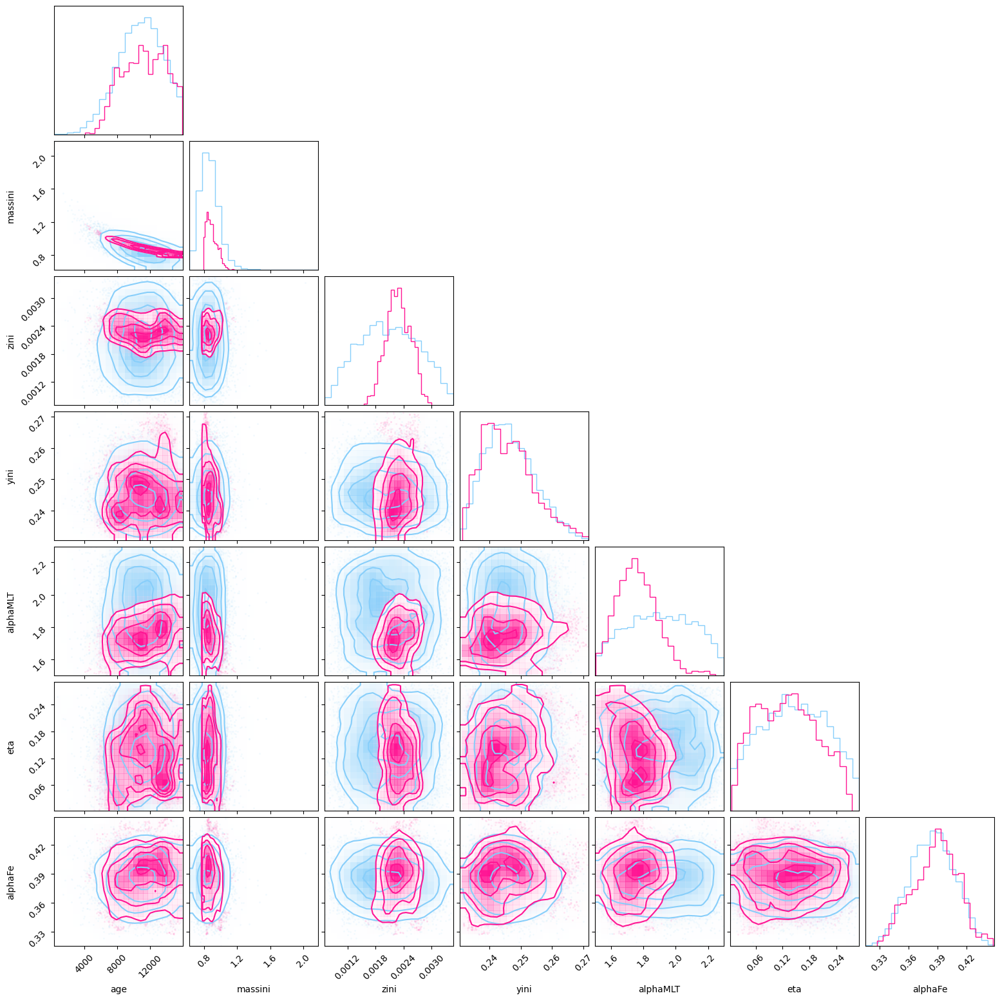

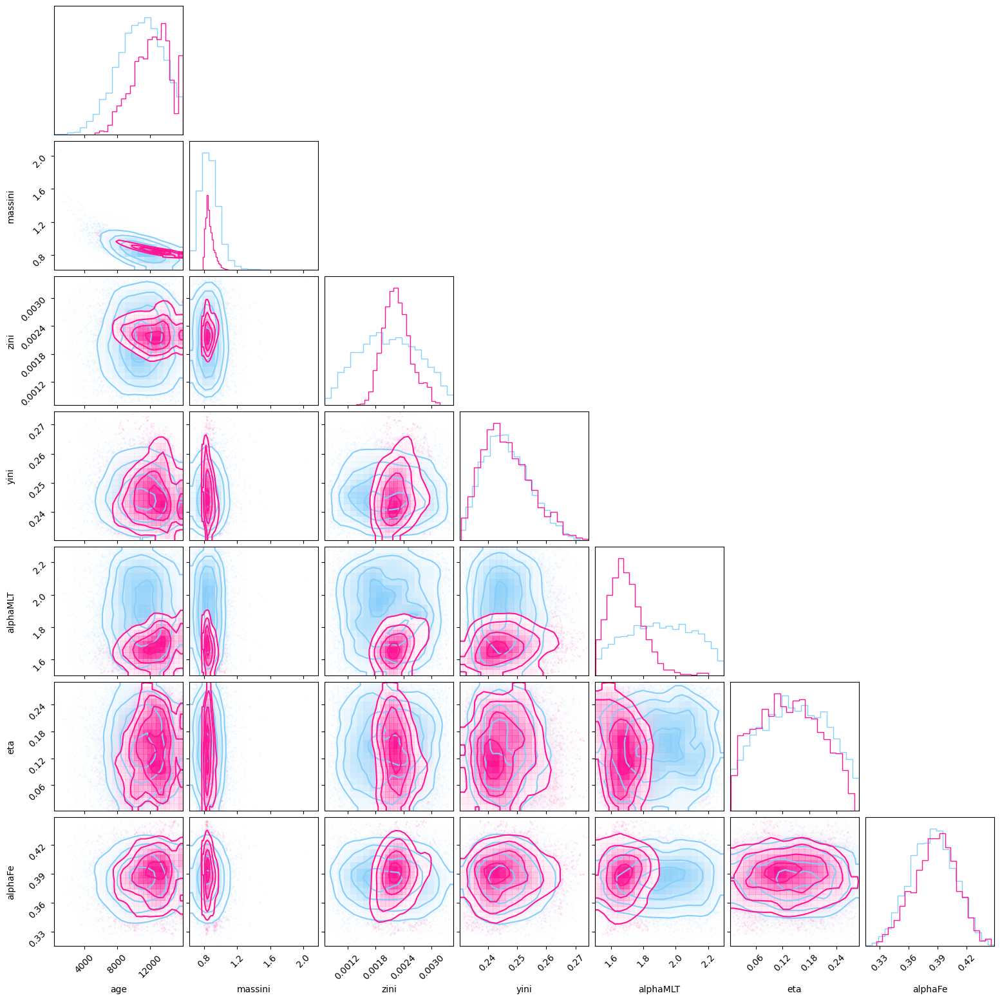

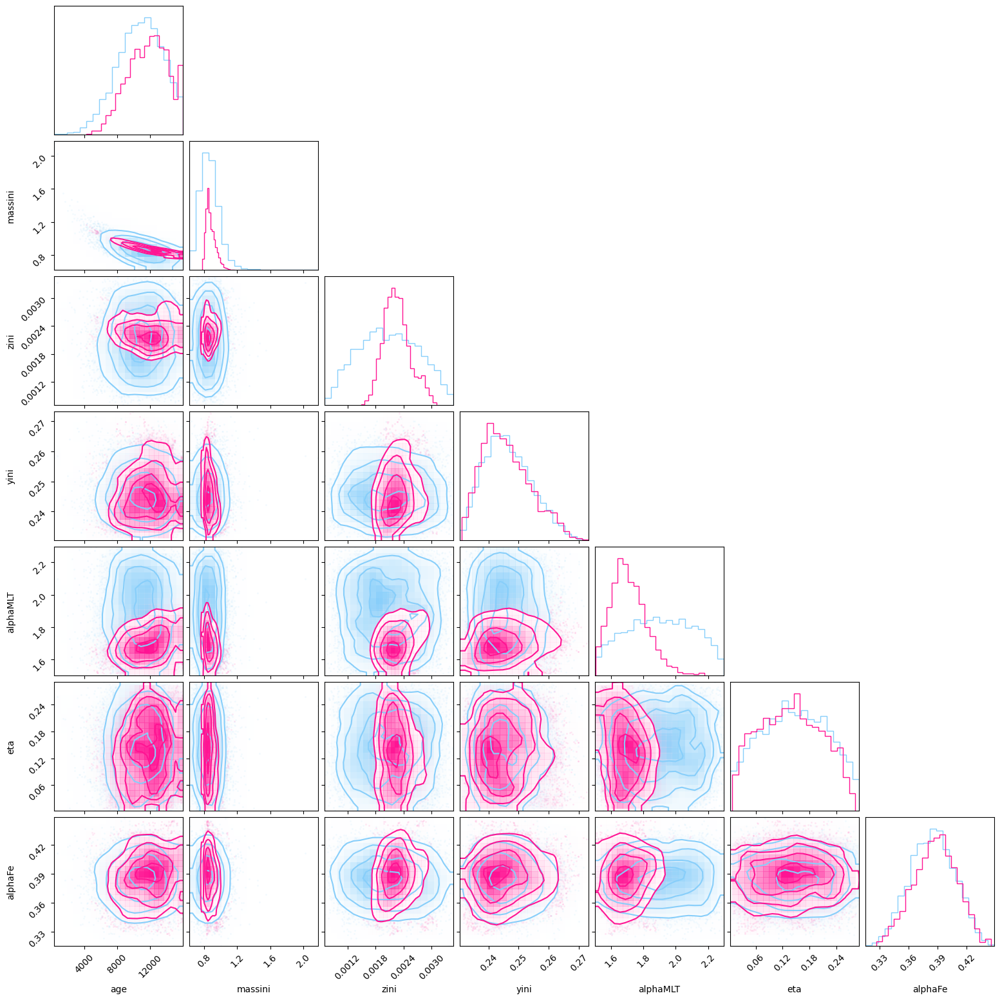

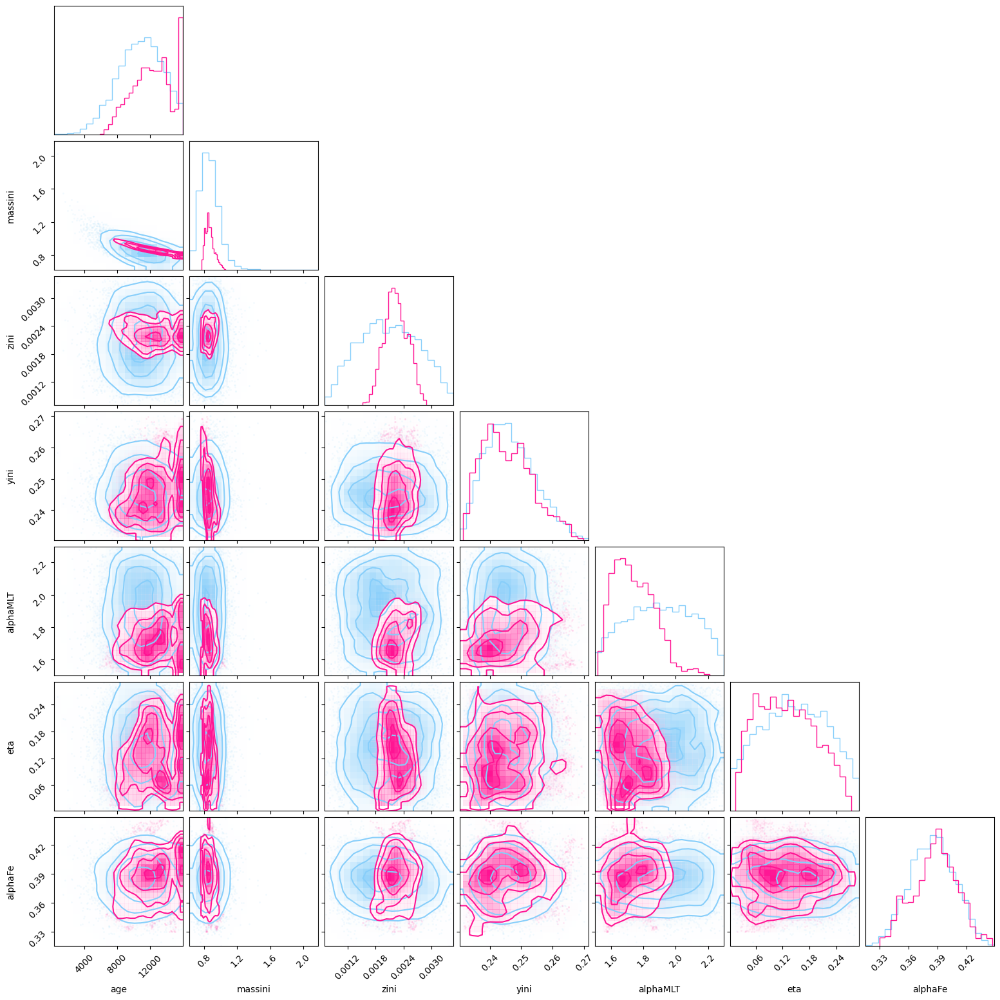

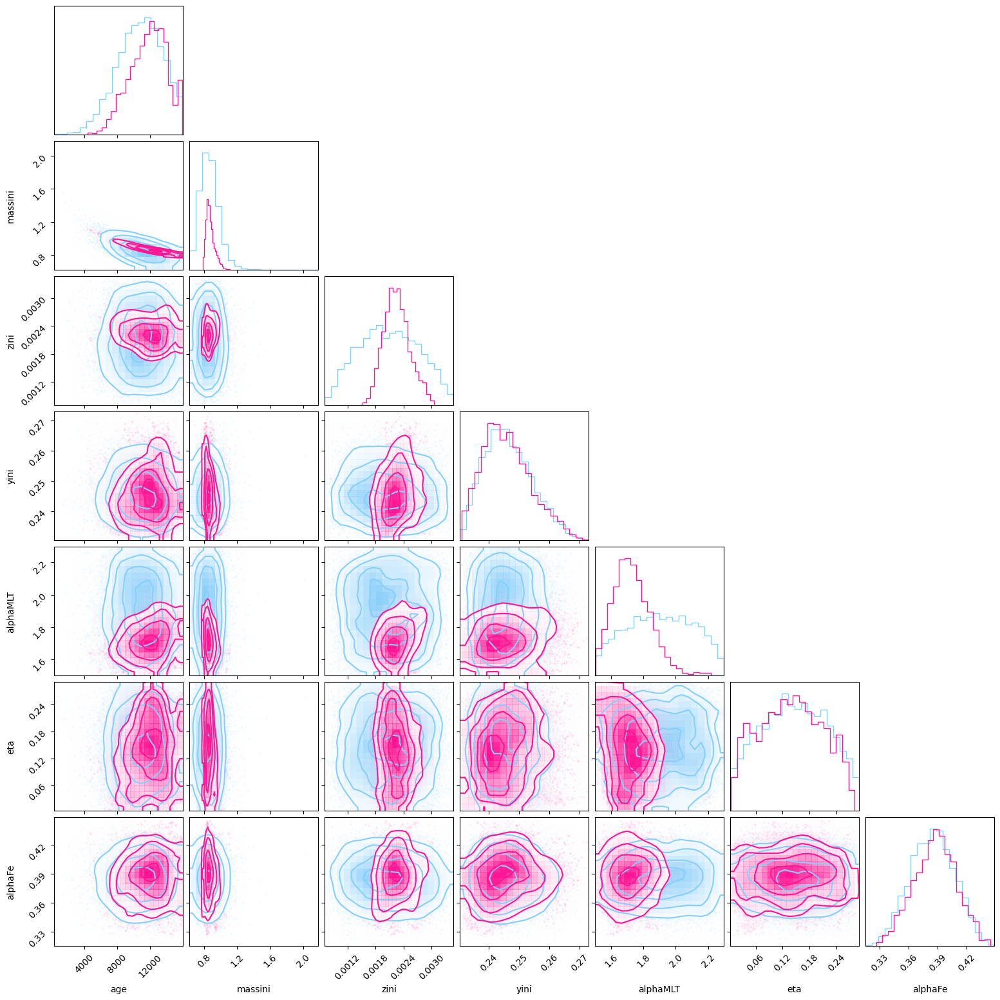

...

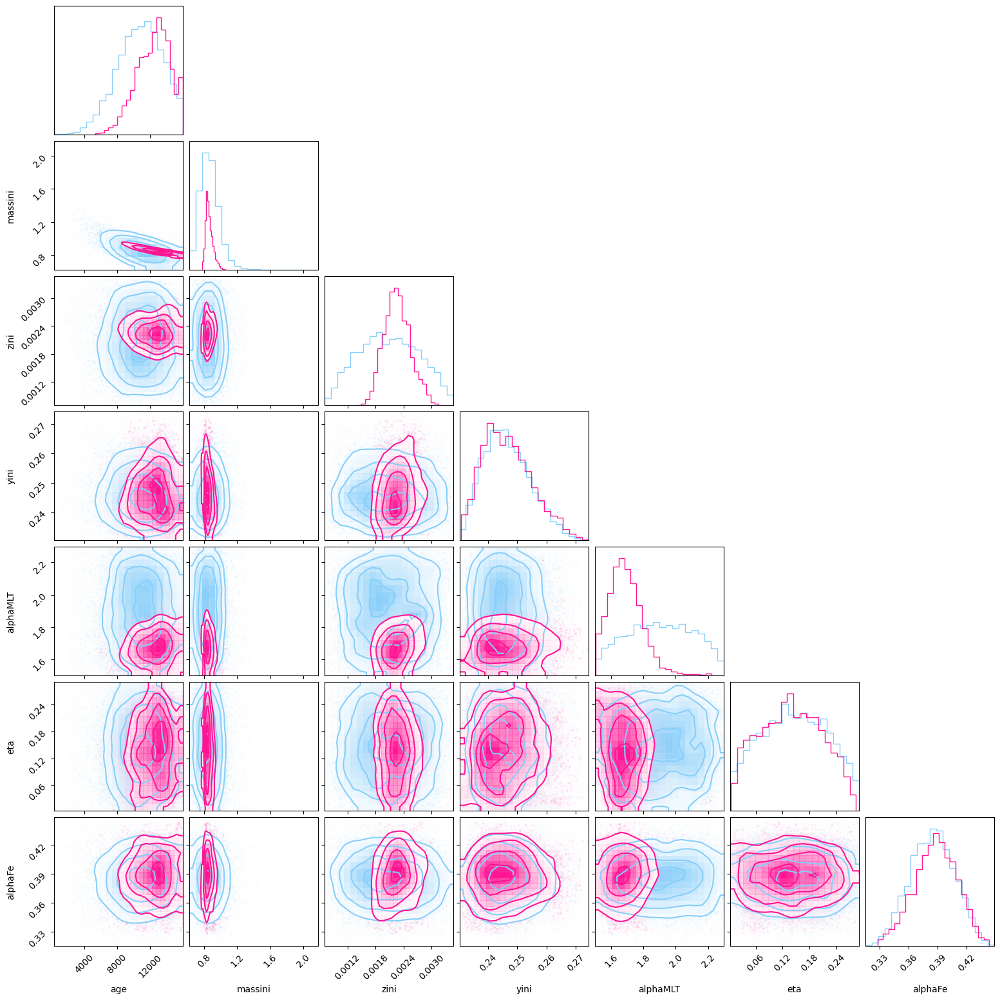

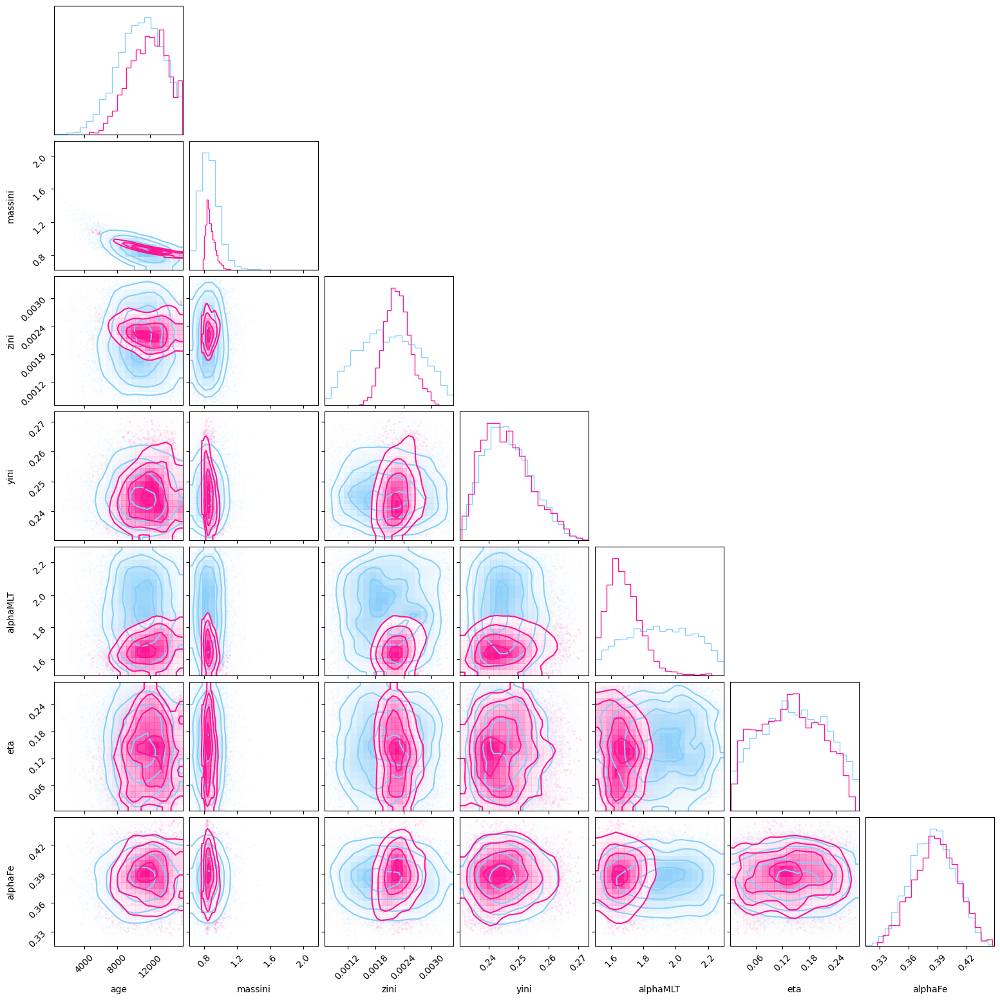

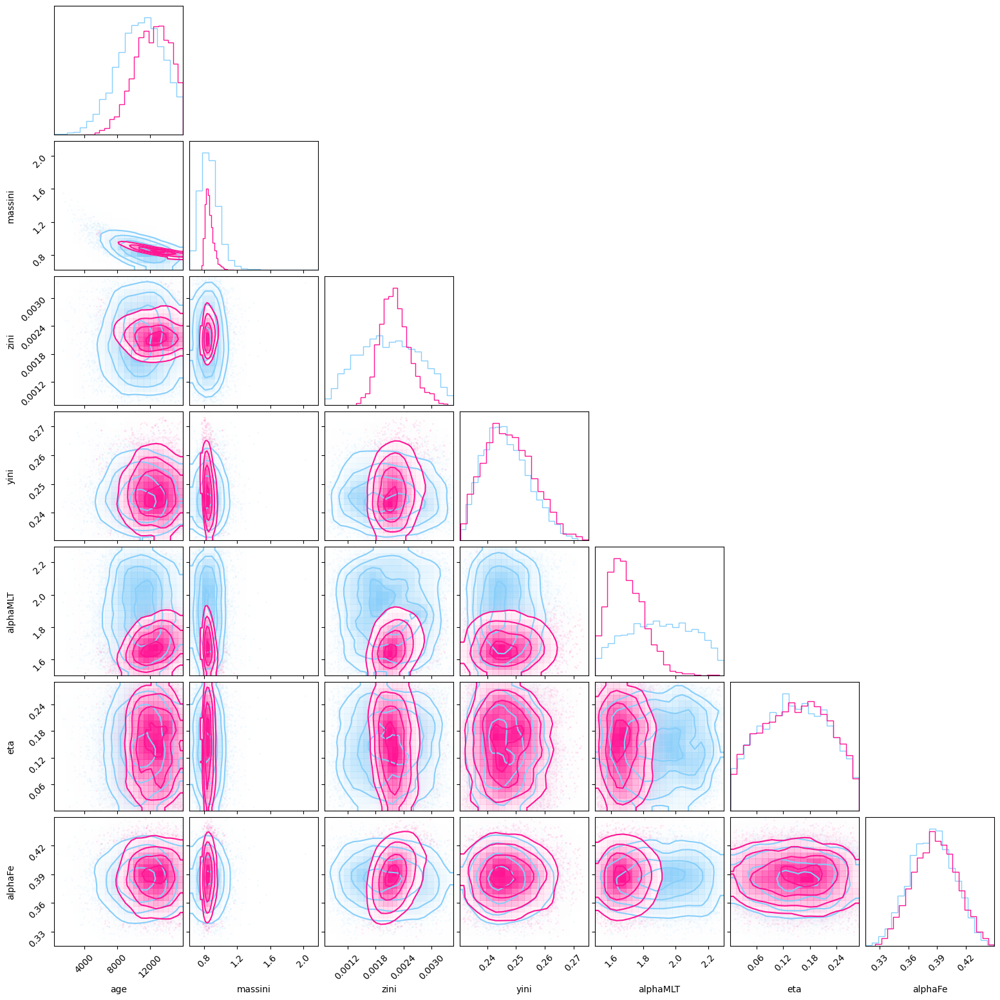

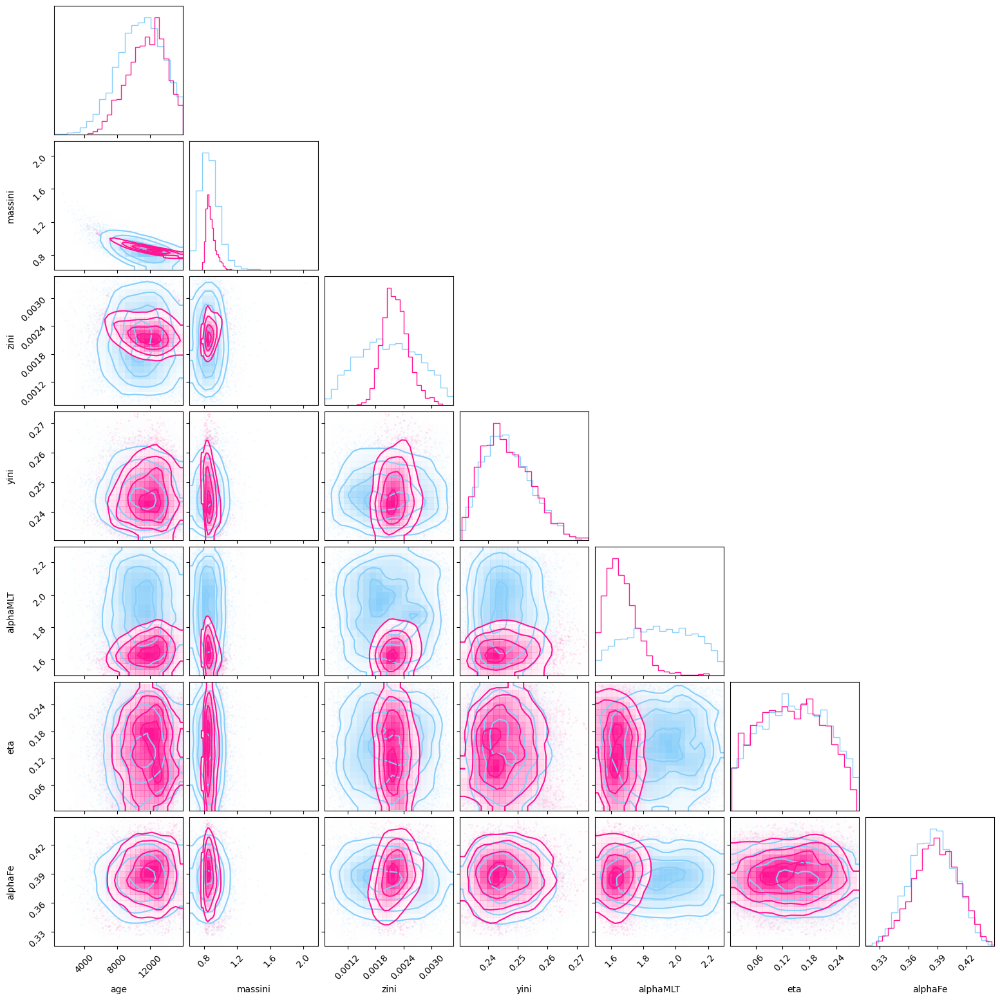

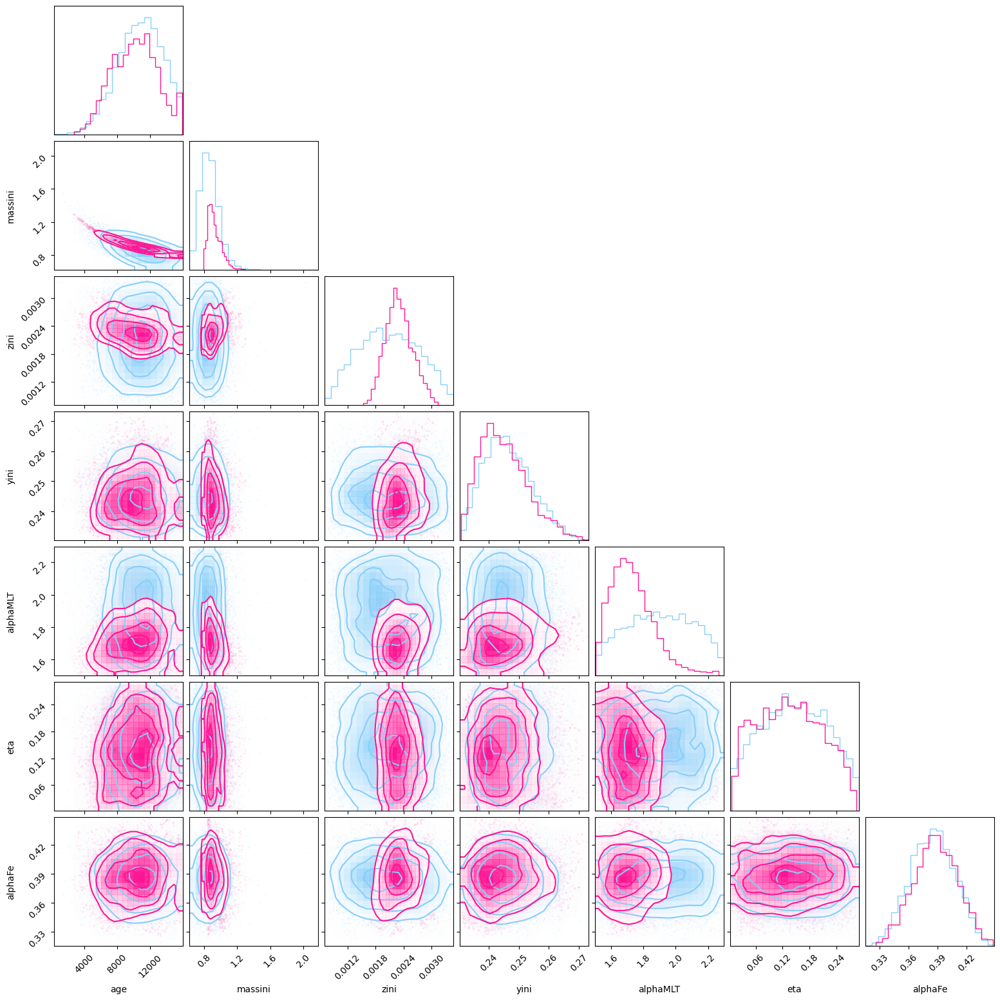

In [29]:
num_warmup, num_samples = 4000, 4000

num_chains = 1

for index in range(len(IDs)):

    num_stars = 1

    star_id = IDs.values[index]

    print(star_id)

#    if star_id in IDs_:
 #       pass
    
    obs = {'FeH':-1.07, 'alphaFe':0.39, 'Teff':Teff.values[index], 'dnuSer':dnu.values[index], 'logLPhot':np.log10(LPhot.values[index]), 'LPhot':LPhot.values[index]}
    
    unc = {'Teff':100, 'alphaFe':0.03, 'dnuSer':ednu.values[index], 'FeH':0.05, 'logLPhot':eLPhot.values[index]/LPhot.values[index]*1/np.log(10), 'LPhot':eLPhot.values[index]}
    
    sampler = NUTS(star, target_accept_prob=0.8, find_heuristic_step_size=True, init_strategy=numpyro.infer.init_to_sample) #May be worth trying init_to_sample

    mcmc = MCMC(sampler, num_warmup=num_warmup, num_samples=num_samples, num_chains=num_chains)

    rng_key = jax.random.PRNGKey(0)

    rng_key, rng_key_ = jax.random.split(rng_key)

    num_prior_samples = 4000

    prior_predictive = Predictive(star, num_samples=num_prior_samples,)

    prior = prior_predictive(rng_key_, \
                         uncs=unc, )

    coords = {"star": np.arange(num_stars)}
    dims = {}
    for key, value in prior.items():
        dims[key] = dim = []
        if value.ndim == 1:
            continue
        if value.shape[-1] == num_stars:
            dim.append("star")

    data = az.from_numpyro(prior=prior, coords=coords, dims=dims)

    mcmc.run(jax.random.PRNGKey(0),  uncs=unc, obs=obs)

    mcmc.print_summary()

    posterior = mcmc.get_samples(group_by_chain=True)

    sample_stats = mcmc.get_extra_fields(group_by_chain=True)

    rng, key = jax.random.split(jax.random.PRNGKey(0))

    sample_stats = mcmc.get_extra_fields(group_by_chain=True)

    summary_stats = numpyro.diagnostics.summary(posterior)

    data += az.from_dict(posterior, sample_stats=sample_stats, summary_stats = summary_stats, coords=coords, dims=dims)

    fig = corner.corner(data, group="prior", var_names = ['age', 'massini', 'zini', 'yini', 'alphaMLT', 'eta', 'alphaFe'],  color = 'lightskyblue', smooth = True, plot_datapoints = True,  weights = np.ones(num_prior_samples)/(num_prior_samples), coords = {'star':0})
    
    corner.corner(data, group="posterior", var_names = ['age', 'massini', 'zini', 'yini', 'alphaMLT', 'eta', 'alphaFe'],  color = 'deeppink', zorder = 1,smooth = True, plot_datapoints = True,  weights = np.ones(num_chains*num_samples)/(num_chains*num_samples),fig = fig, coords = {'star':0})


In [13]:
obs

{'FeH': -1.07,
 'alphaFe': 0.39,
 'Teff': np.float64(4708.0),
 'dnuSer': np.float64(4.39168996709785),
 'logLPhot': np.float64(1.692882154722619),
 'LPhot': np.float64(49.304)}

In [ ]:
params_unnorm = 

params_norm = (params_unnorm - mins_in)/(maxes_in - mins_in)

pred_norm = jax_model.jit_forward_pass(params_norm)

pred = pred_norm*(maxes_out - mins_out) + mins_out